In [1]:
import ROOT
from sys import exit
import numpy as np
from numpy.testing import assert_array_equal
from nose.tools import (raises, assert_raises, assert_true,
                        assert_equal, assert_almost_equal)
import root_numpy as rnp
import pandas as pd
from pandas.plotting import scatter_matrix
ROOT.ROOT.EnableImplicitMT()

from sklearn import preprocessing

import torch as torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.optim as optim

#read in key parameters from root file
#data = rnp.root2array("../data_02/mlTree.root","mltree",branches=['x','e1','e2','e3','e12','e13',
#                                                                   'e23','e123','recoilID'])

data_in = rnp.root2array("../data_02/pyTree.root","pytree",
                         branches=['e0','e1','e2','e3','e4','e5','e6','x','m','gmult','ge','gid','glabel'])
assert_equal(data_in.dtype.names, ('e0','e1','e2','e3','e4','e5','e6','x','m','gmult','ge','gid','glabel'))

#convert to pandas
df = pd.DataFrame(data=data_in)

x = df.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0,1))
x_scaled = min_max_scaler.fit_transform(x)
res_df = pd.DataFrame(x_scaled)
df_g1293 = df[(df['ge'] > 1280) & (df['ge'] < 1305)]
g1293_tot = df_g1293.size/9
print(g1293_tot)
print(df)
print(res_df)


#data to torch tensor
X = torch.from_numpy(res_df.values).float().to(torch.device('cpu'))
print(X.shape)
print(X)


Welcome to JupyROOT 6.18/04
11882.0
                e0           e1           e2           e3           e4  \
0      2107.300781  1223.759155  1764.864014  3331.060059  3872.164795   
1      1313.433472   648.959229   713.864014  1962.392700  2027.297485   
2      2086.162354  1304.159180  1764.864014  3390.321533  3851.026367   
3      1592.931152   842.159180  1084.864014  2435.090332  2677.795166   
4      1736.203125   995.759216  1127.864014  2731.962402  2864.067139   
...            ...          ...          ...          ...          ...   
35283  1625.559692   930.443481  1058.869019  2556.003174  2684.428711   
35284  1747.879639   925.123474  1218.869019  2673.003174  2966.748535   
35285  1599.983643   875.913452  1051.869019  2475.896973  2651.852539   
35286  1246.367676   574.003479   684.869019  1820.371094  1931.236694   
35287  1205.223633   439.673462   562.869019  1644.897095  1768.092651   

                e5           e6           x            m  gmult           g

In [2]:
#look at data loaded
import matplotlib.pyplot as plt
import plotly.express as px

plt.figure(figsize=(5,2))
fig = px.histogram(df, x="glabel",nbins=8)
fig.update_xaxes(range=[-1, 5])
fig.show()

fig = px.histogram(df, x="ge",nbins=3000)
fig.update_xaxes(range=[100, 3100])
fig.show()

fig = px.scatter(df, x="e2",y="e4",color="glabel",opacity=0.5)
fig.show()


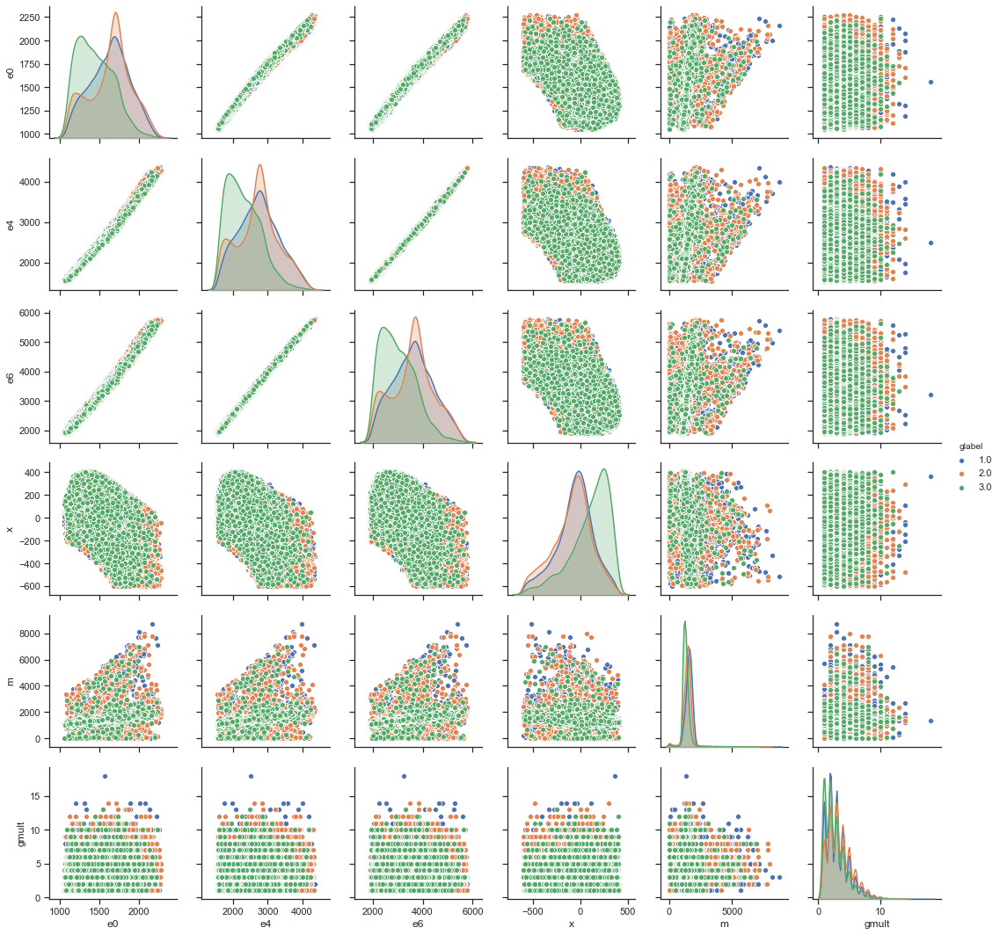

In [3]:
#plt.figure(figsize=(10,4))
#scatter_matrix(df, alpha=0.8, figsize=(4,4), diagonal='kde')
#plt.show()

import seaborn as sns
sns.set(style="ticks")

sns.pairplot(df, hue="glabel", vars=["e0", "e4", "e6", "x", "m","gmult"])

In [4]:
class Net(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(10, 20)
        self.relu1 = nn.ReLU()
        self.dout = nn.Dropout(0.2)
        self.fc2 = nn.Linear(20, 10)
        self.prelu = nn.PReLU(1)
        self.out = nn.Linear(10, 1)
        self.out_act = nn.Sigmoid()
        
    def forward(self, input_):
        a1 = self.fc1(input_)
        h1 = self.relu1(a1)
        dout = self.dout(h1)
        a2 = self.fc2(dout)
        h2 = self.prelu(a2)
        a3 = self.out(h2)
        y = self.out_act(a3)
        return y
    
net = Net()
opt = optim.Adam(net.parameters(), lr=0.001, betas=(0.9, 0.999))
criterion = nn.BCELoss()

In [5]:
def train_epoch(model, opt, criterion, batch_size=500):
    model.train()
    losses = []
    correct = 0
    total = 0
    for beg_i in range(0, X.size(0), batch_size):
        x_batch = X[beg_i:beg_i + batch_size, 0:10]
        #print(x_batch)
        y_batch = X[beg_i:beg_i + batch_size, 11:12]
        #print(y_batch.shape)
        x_batch = Variable(x_batch)
        y_batch = Variable(y_batch)
        
        opt.zero_grad()
        # (1) Forward
        y_hat = net(x_batch)
        #
        # (2) Percent test on batch
        with torch.no_grad():
            y_round = torch.round(y_hat)
            total += y_batch.size(0)
            correct += (y_round == y_batch).sum().item()
            
                
        # (3) Compute diff
        loss = criterion(y_hat, y_batch)
        
        # (3) Compute gradients
        loss.backward()
        
        # (4) update weights
        opt.step()        
        losses.append(loss.data.numpy())
    
    print('Accuracy of the network on the current batch of data: %f %%' % (
        100 * correct / total))
    return losses

In [6]:
e_losses = []
num_epochs = 500
for e in range(num_epochs):
    e_losses += train_epoch(net, opt, criterion)

Accuracy of the network on the current batch of data: 50.793471 %
Accuracy of the network on the current batch of data: 55.194400 %
Accuracy of the network on the current batch of data: 55.712990 %
Accuracy of the network on the current batch of data: 56.772841 %
Accuracy of the network on the current batch of data: 57.367944 %
Accuracy of the network on the current batch of data: 58.189753 %
Accuracy of the network on the current batch of data: 58.954886 %
Accuracy of the network on the current batch of data: 60.128089 %
Accuracy of the network on the current batch of data: 61.091589 %
Accuracy of the network on the current batch of data: 62.868397 %
Accuracy of the network on the current batch of data: 64.645205 %
Accuracy of the network on the current batch of data: 65.965767 %
Accuracy of the network on the current batch of data: 67.150306 %
Accuracy of the network on the current batch of data: 68.275334 %
Accuracy of the network on the current batch of data: 68.646565 %
Accuracy o

Accuracy of the network on the current batch of data: 76.241215 %
Accuracy of the network on the current batch of data: 75.903990 %
Accuracy of the network on the current batch of data: 76.156200 %
Accuracy of the network on the current batch of data: 76.119361 %
Accuracy of the network on the current batch of data: 76.280889 %
Accuracy of the network on the current batch of data: 76.241215 %
Accuracy of the network on the current batch of data: 76.082521 %
Accuracy of the network on the current batch of data: 76.147699 %
Accuracy of the network on the current batch of data: 76.261052 %
Accuracy of the network on the current batch of data: 76.244049 %
Accuracy of the network on the current batch of data: 76.034346 %
Accuracy of the network on the current batch of data: 76.110859 %
Accuracy of the network on the current batch of data: 76.300725 %
Accuracy of the network on the current batch of data: 76.201542 %
Accuracy of the network on the current batch of data: 76.402743 %
Accuracy o

Accuracy of the network on the current batch of data: 76.425414 %
Accuracy of the network on the current batch of data: 76.504761 %
Accuracy of the network on the current batch of data: 76.479256 %
Accuracy of the network on the current batch of data: 76.510428 %
Accuracy of the network on the current batch of data: 76.320562 %
Accuracy of the network on the current batch of data: 76.547268 %
Accuracy of the network on the current batch of data: 76.527431 %
Accuracy of the network on the current batch of data: 76.329064 %
Accuracy of the network on the current batch of data: 76.609612 %
Accuracy of the network on the current batch of data: 76.337565 %
Accuracy of the network on the current batch of data: 76.416912 %
Accuracy of the network on the current batch of data: 76.445251 %
Accuracy of the network on the current batch of data: 76.448084 %
Accuracy of the network on the current batch of data: 76.380073 %
Accuracy of the network on the current batch of data: 76.516096 %
Accuracy o

Accuracy of the network on the current batch of data: 76.547268 %
Accuracy of the network on the current batch of data: 76.496259 %
Accuracy of the network on the current batch of data: 76.405577 %
Accuracy of the network on the current batch of data: 76.620948 %
Accuracy of the network on the current batch of data: 76.555770 %
Accuracy of the network on the current batch of data: 76.547268 %
Accuracy of the network on the current batch of data: 76.734301 %
Accuracy of the network on the current batch of data: 76.490592 %
Accuracy of the network on the current batch of data: 76.297892 %
Accuracy of the network on the current batch of data: 76.544434 %
Accuracy of the network on the current batch of data: 76.496259 %
Accuracy of the network on the current batch of data: 76.652120 %
Accuracy of the network on the current batch of data: 76.399909 %
Accuracy of the network on the current batch of data: 76.595443 %
Accuracy of the network on the current batch of data: 76.385740 %
Accuracy o

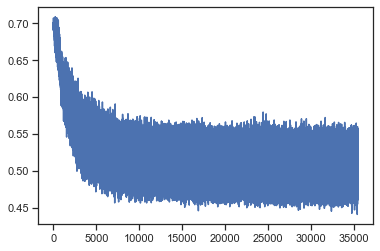

In [7]:
plt.plot(e_losses)
#print(net.parameters)
#print(net.state_dict())
#save_path="./model_saves/march15.pt"
#torch.save(net, "./model_saves/march15.pt")
#model = torch.load(save_path)
#model.eval()

In [8]:
net.eval()
with torch.no_grad():
    result = net(X[0:100000,0:10])
    #result = torch.round(result)

In [9]:
#plt.plot(result.data)
print(torch.max(result))
print(torch.min(result))
torch.histc(result)
#print(result.data)

df_F = pd.DataFrame(data=result.numpy())
#print(df_F)
df_F.columns = ["A"]

fig = px.histogram(df_F,x="A",nbins=100)
fig.update_xaxes(range=[0.0,1.0])
fig.show()

tensor(0.9588)
tensor(0.1241)


In [10]:
#pull out events from model decision
result_df = pd.concat([df, df_F], axis=1)
#print(result_df)
s38_low=0.8
s38 = result_df[(result_df['A'] > s38_low) & (result_df['A'] < 1)]
cl38 = result_df[(result_df['A'] < 0.3) & (result_df['A'] < 1)]
misc = result_df[(result_df['A'] > 0.3) & (result_df['A'] < 0.7)]


In [11]:
#plt.figure(figsize=(10,4))
#fig = px.scatter(result_df, x="e2",y="e0",color="A",opacity=0.5)
#fig.show()

#plt.figure(figsize=(10,4))
#fig = px.scatter(result_df, x="ge",y="A",opacity=0.5)
#fig.show()
g1293a = result_df[(result_df['A'] > s38_low) & (result_df['ge'] >1280) & (result_df['ge'] < 1305)]
g1293_s38 = g1293a.size/10
g1293b = result_df[(result_df['A'] < 0.3) & (result_df['ge'] >1280) & (result_df['ge'] < 1305)]
g1293_cl38 = g1293b.size/10
g1293c = result_df[(result_df['A'] > 0.3) & (result_df['A'] < 0.8) & 
                   (result_df['ge'] >1280) & (result_df['ge'] < 1305)]
g1293_misc = g1293c.size/10



#print(s38.size/10)
print("Percent of total 1293 gamma rays for 38S: %d/%d*100.0 = %2.1f %%" 
      % (g1293_s38,g1293_tot,g1293_s38/g1293_tot*100.0))

#print(g1293b.size/10)
#print(g1293c.size/10)

#print(cl38.size/10)
#print(misc.size/10)

plt.figure(figsize=(10,4))
fig = px.histogram(s38, x="ge", nbins=3000, color = "glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()

plt.figure(figsize=(10,4))
fig = px.histogram(cl38, x="ge", nbins=3000, color = "glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()

plt.figure(figsize=(10,4))
fig = px.histogram(misc, x="ge", nbins=3000, color = "glabel")
fig.update_xaxes(range=[100, 3100])
fig.show()


Percent of total 1293 gamma rays for 38S: 7466/11882*100.0 = 62.8 %


<Figure size 720x288 with 0 Axes>

<Figure size 720x288 with 0 Axes>

<Figure size 720x288 with 0 Axes>